## Importing the required packages

In [1]:
import numpy as np 
import pandas as pd 
import shutil
import tensorflow as tf
from zipfile import ZipFile 
import keras.backend as K
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
from PIL import Image
from sklearn.metrics import confusion_matrix
import random

## A function for building a data frame for the paths to images

In [2]:
def build_data_frame(images_folder, column_name):
    image_ids = []
    file_paths = []
    for root, _, files in os.walk(images_folder):
        for file in files:
            full_path = os.path.join(root, file)    
            file_paths.append(full_path)

            image_id = file.partition(".")[0]
            image_ids.append(image_id)

    data = {"id": image_ids, column_name: file_paths}
    dataframe = pd.DataFrame(data)
    dataframe = dataframe.set_index('id')
    return dataframe

## A function for Visualization of the Predictions

In [3]:
def show_images(images_to_display):
    plt.figure(figsize=(15, 15))
    captions = ['Input Image', 'True Mask', 'Predicted Mask']

    for idx, image in enumerate(images_to_display):
        plt.subplot(1, len(images_to_display), idx+1)
        plt.title(captions[idx])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image))
        plt.axis('off')
    plt.show()

## A Function for Sorting the Images and the Corresponding Masks

In [4]:
def create_directory(directory_name):
    if not os.path.exists(directory_name):
        os.makedirs(directory_name)

In [5]:
# Directories setup
create_directory('train')
create_directory('train_masks')

In [6]:
base_dir = './PV03'
data_directory = os.path.join(base_dir)

image_directory = './train'
mask_directory = './train_masks'
create_directory(image_directory)
create_directory(mask_directory)

image_files = []
mask_files = []

for (path, _, files) in os.walk(data_directory):
    image_files.extend([os.path.join(path, f) for f in files if not '_label' in f])
    mask_files.extend([os.path.join(path, f) for f in files if '_label' in f])

# Valid image extensions
image_extensions = [".jpg", ".jpeg", ".png", ".bmp", ".gif", ".tiff"]

def process_images(image_list, target_directory, is_mask=False):
    for image_path in image_list:
        if os.path.splitext(image_path)[1].lower() in image_extensions:
            source_path = image_path
            destination_file = os.path.basename(image_path)
            if is_mask:
                destination_file = destination_file.replace('_label', '')
            destination_path = os.path.join(target_directory, destination_file)
            with Image.open(source_path) as img:
                resized_img = img.resize((256, 256))
                resized_img.save(destination_path[:-4] + '.png', 'png')

process_images(image_files, image_directory)
process_images(mask_files, mask_directory, is_mask=True)

print("Train set:  ", len(os.listdir("./train")))
print("Train masks:", len(os.listdir("./train_masks")))

Train set:   3303
Train masks: 3285


In [7]:
img_df = build_data_frame('./train', "solar_path")
mask_df = build_data_frame('./train_masks', "mask_path")
img_df["mask_path"] = mask_df["mask_path"]
img_df


,solar_path,mask_path
id,,
PV03_333965_1183305,./train/PV03_333965_1183305.png,./train_masks/PV03_333965_1183305.png
PV03_328184_1186202,./train/PV03_328184_1186202.png,./train_masks/PV03_328184_1186202.png
PV03_344716_1167250,./train/PV03_344716_1167250.png,./train_masks/PV03_344716_1167250.png
PV03_317586_1204779,./train/PV03_317586_1204779.png,./train_masks/PV03_317586_1204779.png
PV03_316704_1203285,./train/PV03_316704_1203285.png,./train_masks/PV03_316704_1203285.png
...,...,...
PV01_325239_1203816,./train/PV01_325239_1203816.png,./train_masks/PV01_325239_1203816.png
PV03_329547_1189664,./train/PV03_329547_1189664.png,./train_masks/PV03_329547_1189664.png
PV01_325331_1205380,./train/PV01_325331_1205380.png,./train_masks/PV01_325331_1205380.png


## Data Preprocessing

In [8]:
# Image size specification
image_dimensions = [256, 256]

def augment_images_with_zoom(image, mask, zoom_range=(0.8, 2.0), p=0.5):
    if random.random() < p:
        zoom_factor = random.uniform(zoom_range[0], zoom_range[1])
        height, width = image.shape[0], image.shape[1]
        new_height, new_width = int(height * zoom_factor), int(width * zoom_factor)

        # Zooming the image with bicubic interpolation
        zoomed_image = tf.image.resize(image, (new_height, new_width), method=tf.image.ResizeMethod.BICUBIC)
        zoomed_image = tf.image.resize_with_crop_or_pad(zoomed_image, height, width)

        # Zooming the mask
        zoomed_mask = tf.image.resize(mask, (new_height, new_width), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        zoomed_mask = tf.image.resize_with_crop_or_pad(zoomed_mask, height, width)

        return zoomed_image, zoomed_mask

    return image, mask

def process_images_for_training(image_path, mask_path, is_training=False):
    # Load and preprocess the solar image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, image_dimensions)
    image = tf.cast(image, tf.float32) / 255.0
    
    # Load and preprocess the mask image
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_jpeg(mask, channels=3)
    mask = tf.image.resize(mask, image_dimensions)
    mask = mask[:, :, :1]  # Extracting only the first channel
    mask = tf.math.sign(mask)

    # Apply zoom augmentation after loading and preprocessing, only if is_training is True
    if is_training:
        image, mask = tf.py_function(func=augment_images_with_zoom, inp=[image, mask], Tout=[tf.float32, tf.float32])

    return image, mask

def generate_dataset(dataframe, is_training=False):
    dataset = tf.data.Dataset.from_tensor_slices((dataframe["solar_path"].values, dataframe["mask_path"].values))
    dataset = dataset.map(lambda img_path, mask_path: process_images_for_training(img_path, mask_path, is_training), tf.data.AUTOTUNE)

    return dataset

## Split into train and test data

In [9]:
img_df = img_df.dropna()
img_df["mask_path"].isnull().any()

False

In [10]:
# Splitting the data into training and validation sets
train_data_frame, validation_data_frame = train_test_split(img_df, random_state=42, test_size=.25)
training_dataset = generate_dataset(train_data_frame, is_training=True)
validation_dataset = generate_dataset(validation_data_frame)

## Parameters for the model

In [11]:
# Dataset parameters
TRAIN_SIZE = len(train_data_frame)
BATCH_SIZE = 24
BUFFER_SIZE = 1000

In [12]:
# Preparing the datasets
training_data = training_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
training_data = training_data.prefetch(buffer_size=tf.data.AUTOTUNE)
validation_data = validation_dataset.batch(BATCH_SIZE)


2024-01-25 12:59:22.294165: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


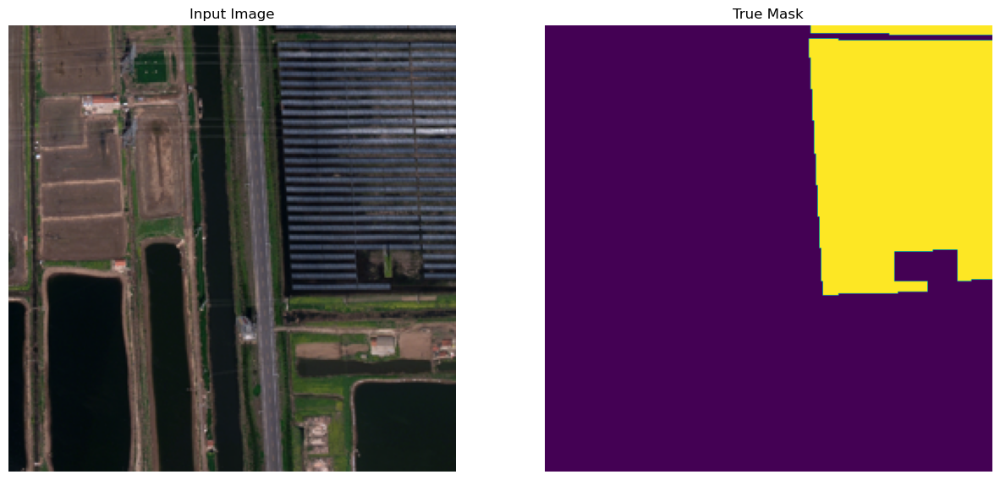

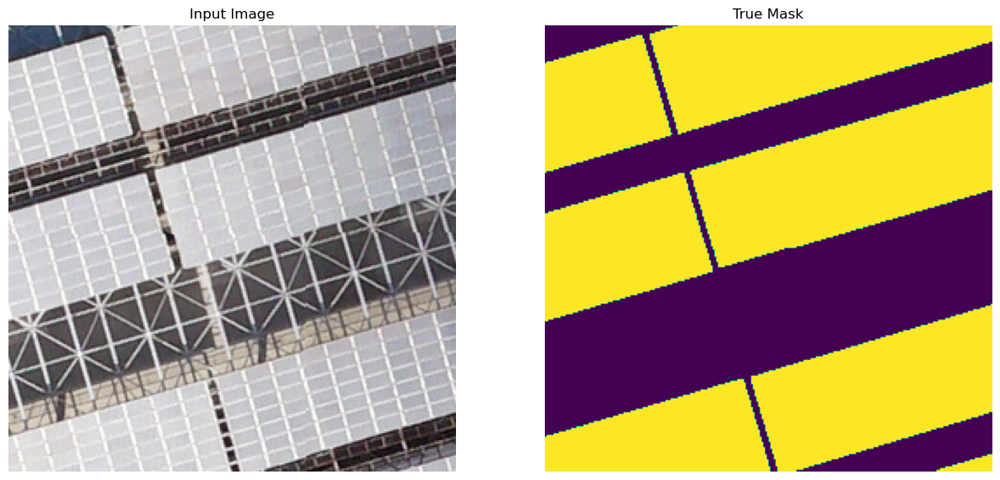

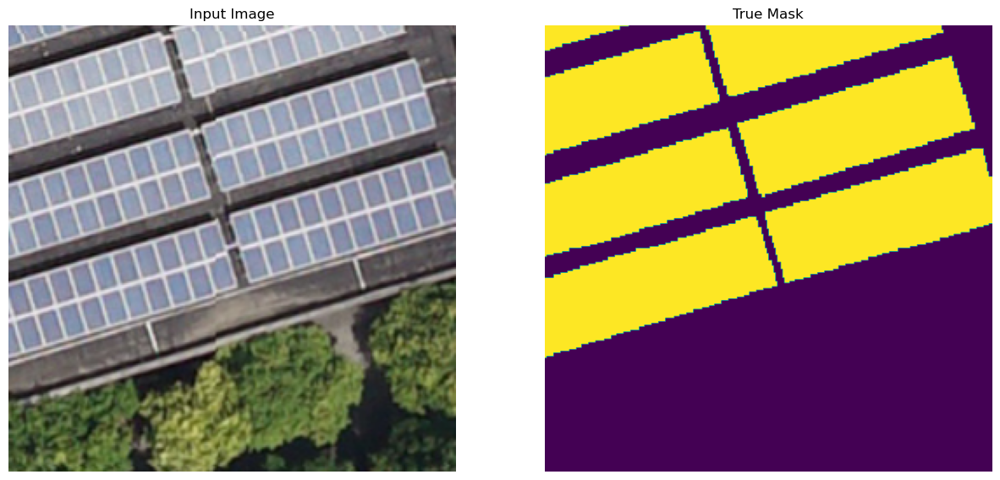

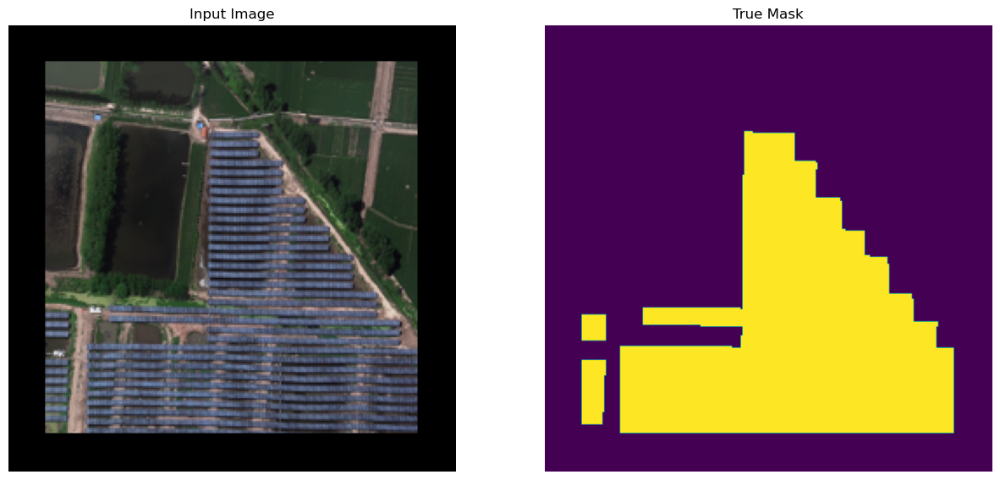

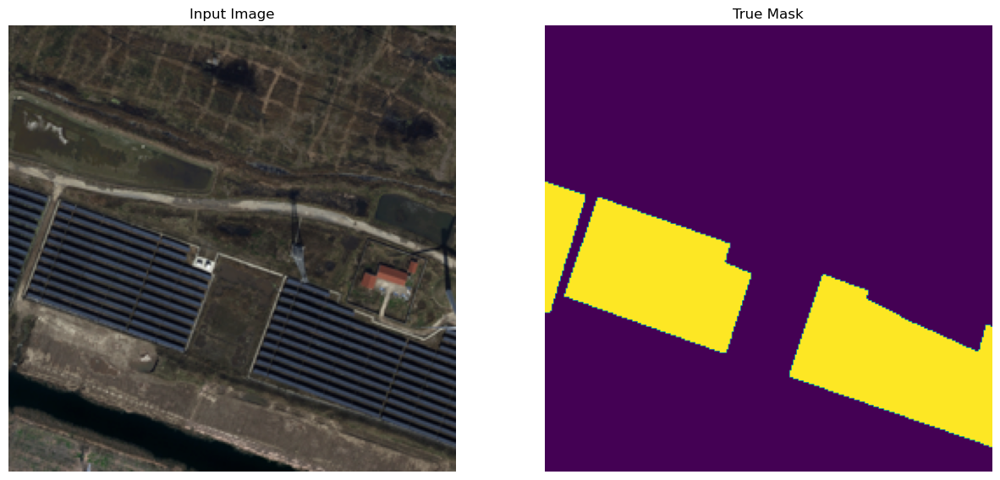

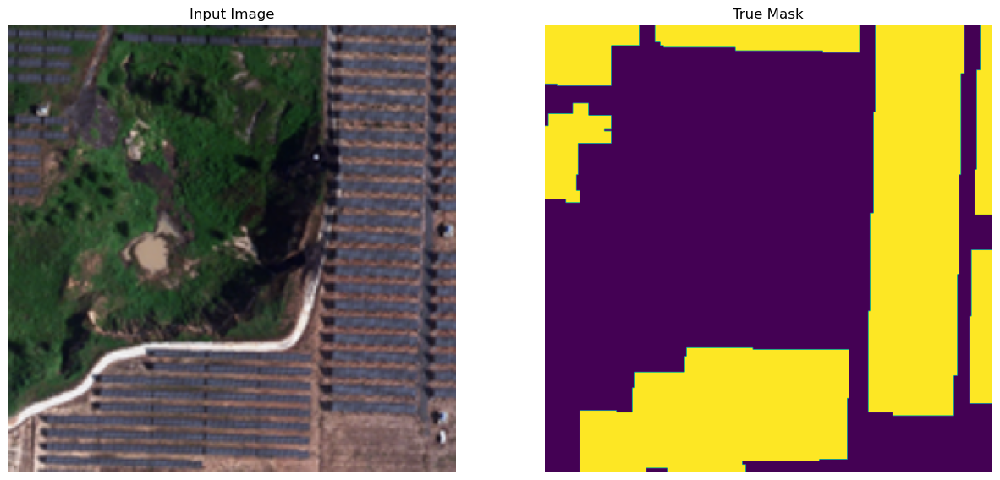

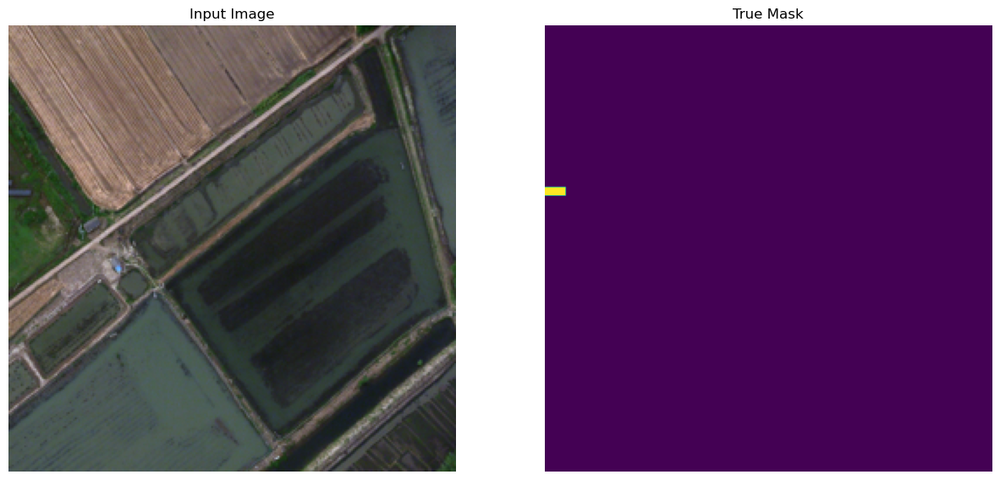

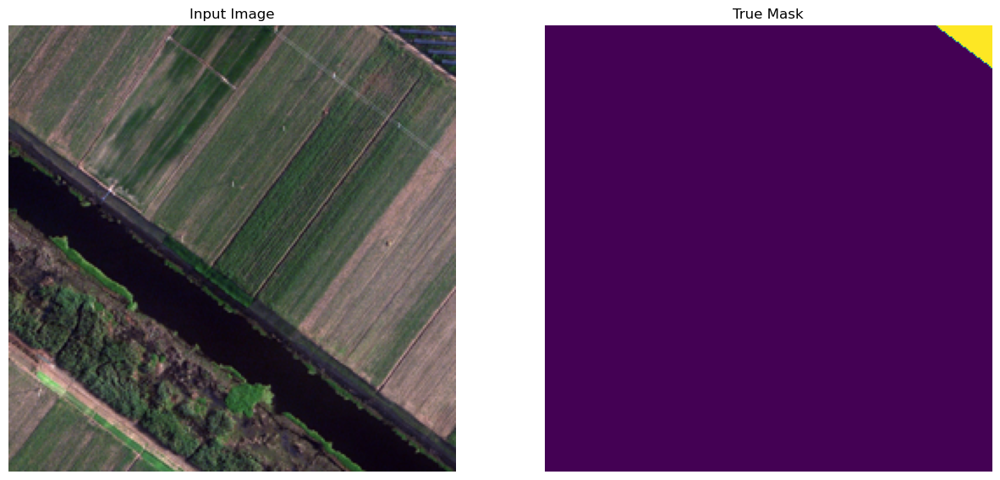

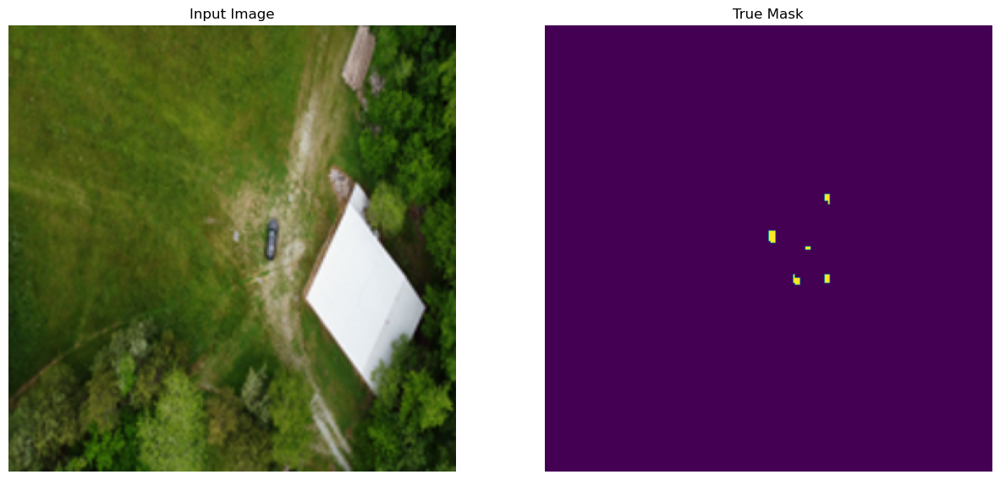

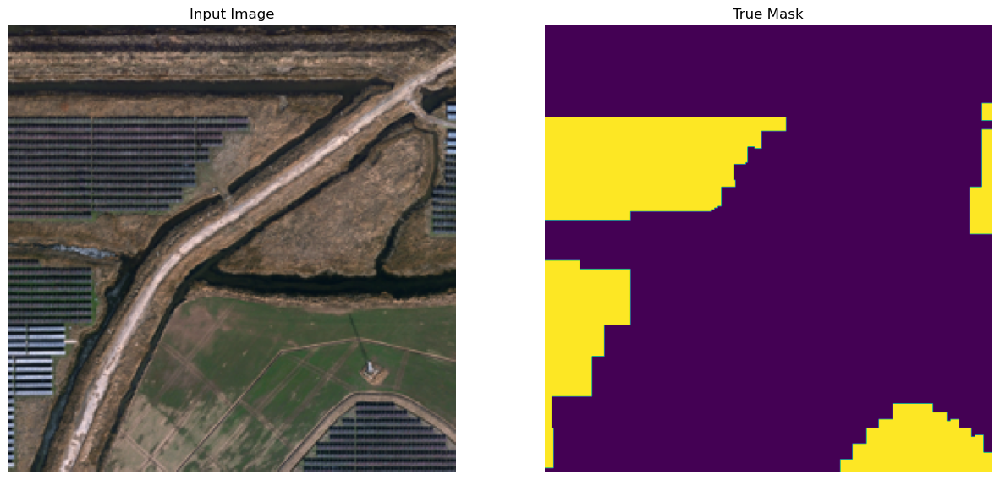

In [13]:
# Let's look the image and it's corresponding mask
'''
for i in range(20):
    for image, mask in training_dataset.take(i):
        sample_image, sample_mask = image, mask
        show_images([sample_image, sample_mask])
'''        
# Visualize first few examples from the training dataset
for i, (image, mask) in enumerate(training_dataset.take(10)):
    sample_image, sample_mask = image, mask
    show_images([sample_image, sample_mask])

## Setting up a U-Net Model

In [14]:
# Setting up the base model for U-Net
base_model = tf.keras.applications.MobileNetV2(input_shape=[256, 256, 3], include_top=False)

# Selecting specific layers for feature extraction
selected_layers = [
    'block_1_expand_relu',
    'block_3_expand_relu',
    'block_6_expand_relu',
    'block_13_expand_relu',
    'block_16_project',
]
layer_outputs = [base_model.get_layer(layer).output for layer in selected_layers]

# Creating the feature extraction model
feature_extractor = tf.keras.Model(inputs=base_model.input, outputs=layer_outputs)
feature_extractor.trainable = False

In [15]:
def create_upsampling_layer(filters, kernel_size, norm_type='batchnorm', apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    sequence = tf.keras.Sequential()
    sequence.add(tf.keras.layers.Conv2DTranspose(filters, kernel_size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))

    if norm_type.lower() == 'batchnorm':
        sequence.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
        sequence.add(InstanceNormalization())

    if apply_dropout:
        sequence.add(tf.keras.layers.Dropout(0.5))

    sequence.add(tf.keras.layers.ReLU())

    return sequence

# Defining the upsampling stack
upsampling_stack = [
    create_upsampling_layer(512, 3),
    create_upsampling_layer(256, 3),
    create_upsampling_layer(128, 3),
    create_upsampling_layer(64, 3),
]

## Defining the U-Net Model

In [16]:
def build_unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    downsamples = feature_extractor(inputs)
    x = downsamples[-1]
    downsamples = reversed(downsamples[:-1])

    for up, skip in zip(upsampling_stack, downsamples):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

    last_layer = tf.keras.layers.Conv2DTranspose(output_channels, 3, strides=2, activation='sigmoid', padding='same')
    x = last_layer(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

# Dice coefficient and loss function for the U-Net model
def dice_coefficient(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean((2. * intersection + smooth) / (union + smooth), axis=0)

def dice_coefficient_loss(in_gt, in_pred):
    return 1 - dice_coefficient(in_gt, in_pred)

# Initializing and compiling the U-Net model
unet_model = build_unet_model(1)
unet_model.compile(optimizer='adam', loss=dice_coefficient_loss, metrics=[dice_coefficient, 'binary_accuracy'])

# Displaying the model architecture
unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 128, 128, 9  1841984     ['input_2[0][0]']                
                                6),                                                               
                                 (None, 64, 64, 144                                               
                                ),                                                                
                                 (None, 32, 32, 192                                         

## Visualization and Prediction

2024-01-25 12:59:47.142781: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


1/1 [==============================] - 0s 374ms/step


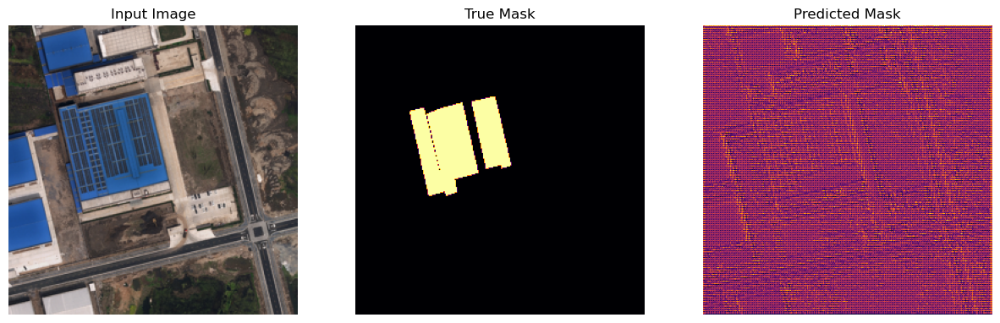

In [17]:
for images, masks in training_data.take(1):
    for img, mask in zip(images, masks):
        sample_image = img
        sample_mask = mask
        break
def visualize(display_list, cmap="inferno"):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        if cmap and i > 0: 
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap=cmap)
        else:
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(sample_image, sample_mask):
    pred_mask = unet_model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(image_dimensions[0],image_dimensions[1],1)
    visualize([sample_image, sample_mask, pred_mask])
    
show_predictions(sample_image, sample_mask)

## Model Training

Epoch 1/50
102/102 [==============================] - 187s 2s/step - loss: 0.4747 - dice_coefficient: 0.5253 - binary_accuracy: 0.7652 - val_loss: 0.2850 - val_dice_coefficient: 0.7172 - val_binary_accuracy: 0.9483
Epoch 2/50
102/102 [==============================] - 198s 2s/step - loss: 0.3057 - dice_coefficient: 0.6942 - binary_accuracy: 0.9503 - val_loss: 0.2505 - val_dice_coefficient: 0.7513 - val_binary_accuracy: 0.9516
Epoch 3/50
102/102 [==============================] - 198s 2s/step - loss: 0.2792 - dice_coefficient: 0.7206 - binary_accuracy: 0.9500 - val_loss: 0.2573 - val_dice_coefficient: 0.7449 - val_binary_accuracy: 0.9474
Epoch 4/50
1/1 [==============================] - 0s 54ms/step


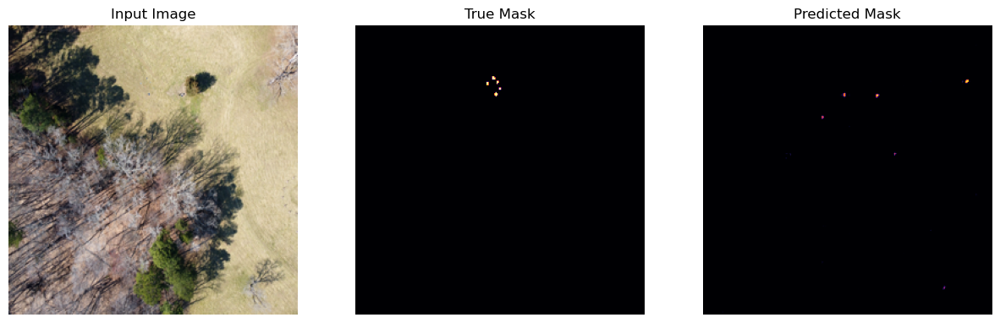

Epoch 5/50
102/102 [==============================] - 208s 2s/step - loss: 0.2388 - dice_coefficient: 0.7611 - binary_accuracy: 0.9502 - val_loss: 0.2375 - val_dice_coefficient: 0.7644 - val_binary_accuracy: 0.9500
Epoch 6/50
102/102 [==============================] - 224s 2s/step - loss: 0.2330 - dice_coefficient: 0.7666 - binary_accuracy: 0.9519 - val_loss: 0.2369 - val_dice_coefficient: 0.7646 - val_binary_accuracy: 0.9514
Epoch 7/50
102/102 [==============================] - 217s 2s/step - loss: 0.2313 - dice_coefficient: 0.7685 - binary_accuracy: 0.9514 - val_loss: 0.2466 - val_dice_coefficient: 0.7540 - val_binary_accuracy: 0.9446
Epoch 8/50
102/102 [==============================] - 222s 2s/step - loss: 0.2165 - dice_coefficient: 0.7833 - binary_accuracy: 0.9535 - val_loss: 0.2301 - val_dice_coefficient: 0.7697 - val_binary_accuracy: 0.9530
Epoch 9/50
1/1 [==============================] - 0s 51ms/step


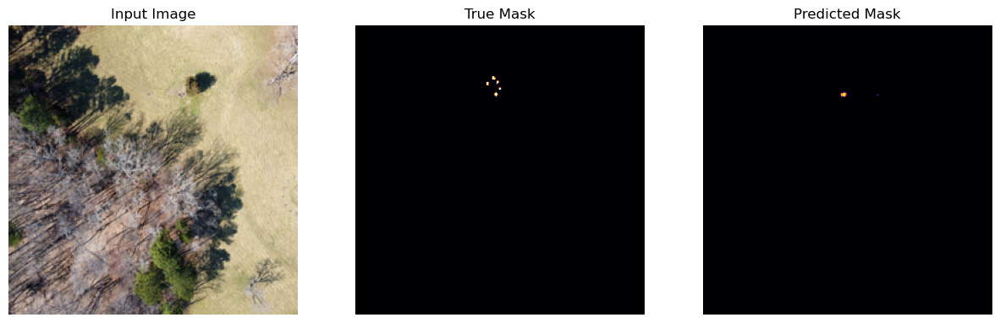

Epoch 10/50
102/102 [==============================] - 226s 2s/step - loss: 0.2076 - dice_coefficient: 0.7925 - binary_accuracy: 0.9547 - val_loss: 0.2296 - val_dice_coefficient: 0.7705 - val_binary_accuracy: 0.9545
Epoch 11/50
102/102 [==============================] - 231s 2s/step - loss: 0.2085 - dice_coefficient: 0.7917 - binary_accuracy: 0.9541 - val_loss: 0.2257 - val_dice_coefficient: 0.7757 - val_binary_accuracy: 0.9558
Epoch 12/50
102/102 [==============================] - 232s 2s/step - loss: 0.2084 - dice_coefficient: 0.7916 - binary_accuracy: 0.9535 - val_loss: 0.2304 - val_dice_coefficient: 0.7689 - val_binary_accuracy: 0.9539
Epoch 13/50
102/102 [==============================] - 235s 2s/step - loss: 0.2018 - dice_coefficient: 0.7983 - binary_accuracy: 0.9547 - val_loss: 0.2254 - val_dice_coefficient: 0.7739 - val_binary_accuracy: 0.9559
Epoch 14/50
1/1 [==============================] - 0s 57ms/step


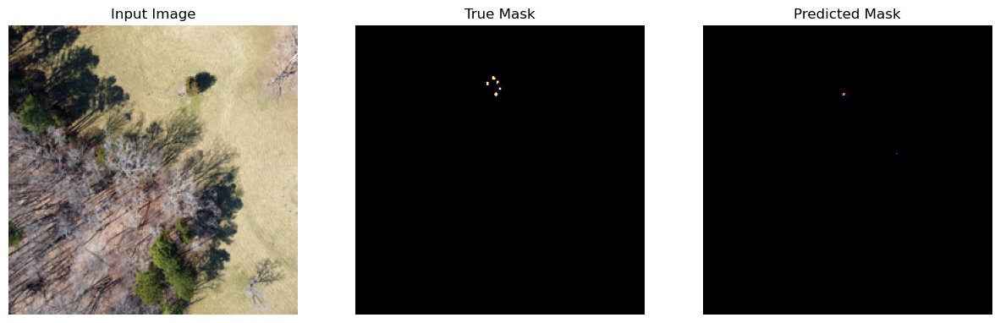

Epoch 15/50
102/102 [==============================] - 231s 2s/step - loss: 0.1897 - dice_coefficient: 0.8103 - binary_accuracy: 0.9574 - val_loss: 0.2179 - val_dice_coefficient: 0.7828 - val_binary_accuracy: 0.9555
Epoch 16/50
102/102 [==============================] - 230s 2s/step - loss: 0.1938 - dice_coefficient: 0.8063 - binary_accuracy: 0.9550 - val_loss: 0.2178 - val_dice_coefficient: 0.7812 - val_binary_accuracy: 0.9552
Epoch 17/50
102/102 [==============================] - 217s 2s/step - loss: 0.1831 - dice_coefficient: 0.8166 - binary_accuracy: 0.9572 - val_loss: 0.2144 - val_dice_coefficient: 0.7850 - val_binary_accuracy: 0.9569
Epoch 18/50
102/102 [==============================] - 222s 2s/step - loss: 0.1782 - dice_coefficient: 0.8216 - binary_accuracy: 0.9584 - val_loss: 0.2106 - val_dice_coefficient: 0.7883 - val_binary_accuracy: 0.9588
Epoch 19/50
1/1 [==============================] - 0s 48ms/step


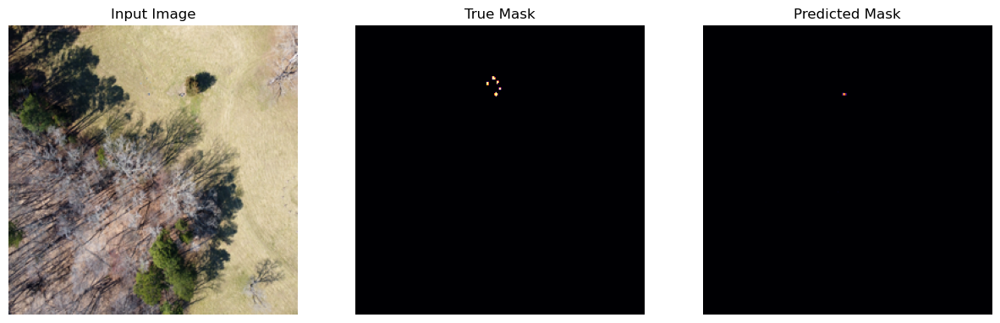

Epoch 20/50
102/102 [==============================] - 219s 2s/step - loss: 0.1787 - dice_coefficient: 0.8215 - binary_accuracy: 0.9596 - val_loss: 0.2112 - val_dice_coefficient: 0.7876 - val_binary_accuracy: 0.9592
Epoch 21/50
102/102 [==============================] - 215s 2s/step - loss: 0.1735 - dice_coefficient: 0.8264 - binary_accuracy: 0.9582 - val_loss: 0.2101 - val_dice_coefficient: 0.7899 - val_binary_accuracy: 0.9580
Epoch 22/50
102/102 [==============================] - 237s 2s/step - loss: 0.1730 - dice_coefficient: 0.8270 - binary_accuracy: 0.9589 - val_loss: 0.2204 - val_dice_coefficient: 0.7785 - val_binary_accuracy: 0.9552
Epoch 23/50
102/102 [==============================] - 232s 2s/step - loss: 0.1687 - dice_coefficient: 0.8315 - binary_accuracy: 0.9597 - val_loss: 0.2115 - val_dice_coefficient: 0.7893 - val_binary_accuracy: 0.9559
Epoch 24/50
1/1 [==============================] - 0s 54ms/step


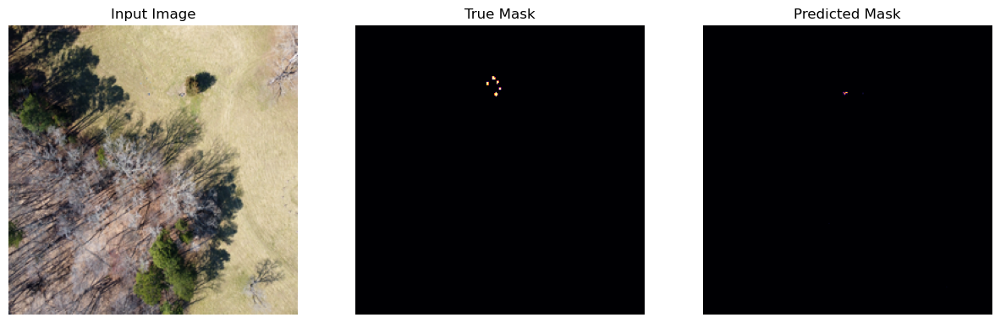

Epoch 25/50
102/102 [==============================] - 207s 2s/step - loss: 0.1731 - dice_coefficient: 0.8271 - binary_accuracy: 0.9599 - val_loss: 0.2109 - val_dice_coefficient: 0.7903 - val_binary_accuracy: 0.9586
Epoch 26/50
102/102 [==============================] - 212s 2s/step - loss: 0.1683 - dice_coefficient: 0.8314 - binary_accuracy: 0.9574 - val_loss: 0.2066 - val_dice_coefficient: 0.7936 - val_binary_accuracy: 0.9584
Epoch 27/50
102/102 [==============================] - 236s 2s/step - loss: 0.1710 - dice_coefficient: 0.8288 - binary_accuracy: 0.9602 - val_loss: 0.2069 - val_dice_coefficient: 0.7940 - val_binary_accuracy: 0.9599
Epoch 28/50
102/102 [==============================] - 207s 2s/step - loss: 0.1595 - dice_coefficient: 0.8407 - binary_accuracy: 0.9595 - val_loss: 0.2057 - val_dice_coefficient: 0.7946 - val_binary_accuracy: 0.9598
Epoch 29/50
1/1 [==============================] - 0s 55ms/step


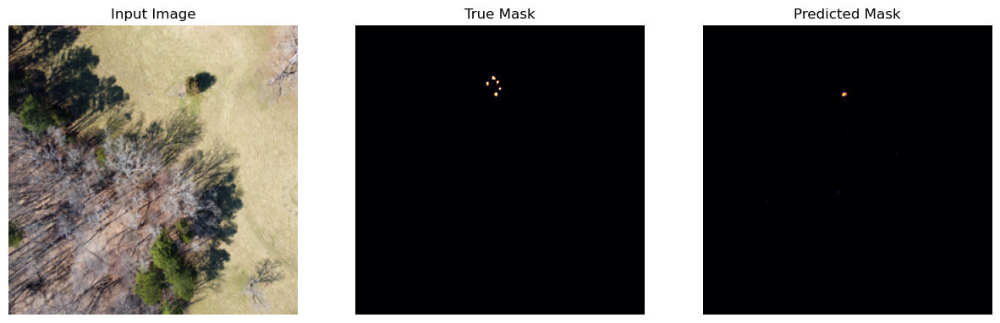

Epoch 30/50
102/102 [==============================] - 213s 2s/step - loss: 0.1559 - dice_coefficient: 0.8445 - binary_accuracy: 0.9607 - val_loss: 0.2051 - val_dice_coefficient: 0.7956 - val_binary_accuracy: 0.9596
Epoch 31/50
102/102 [==============================] - 211s 2s/step - loss: 0.1574 - dice_coefficient: 0.8426 - binary_accuracy: 0.9619 - val_loss: 0.2092 - val_dice_coefficient: 0.7906 - val_binary_accuracy: 0.9600
Epoch 32/50
102/102 [==============================] - 234s 2s/step - loss: 0.1500 - dice_coefficient: 0.8499 - binary_accuracy: 0.9621 - val_loss: 0.1976 - val_dice_coefficient: 0.8010 - val_binary_accuracy: 0.9616
Epoch 33/50
102/102 [==============================] - 225s 2s/step - loss: 0.1507 - dice_coefficient: 0.8495 - binary_accuracy: 0.9630 - val_loss: 0.2048 - val_dice_coefficient: 0.7945 - val_binary_accuracy: 0.9607
Epoch 34/50
1/1 [==============================] - 0s 50ms/step


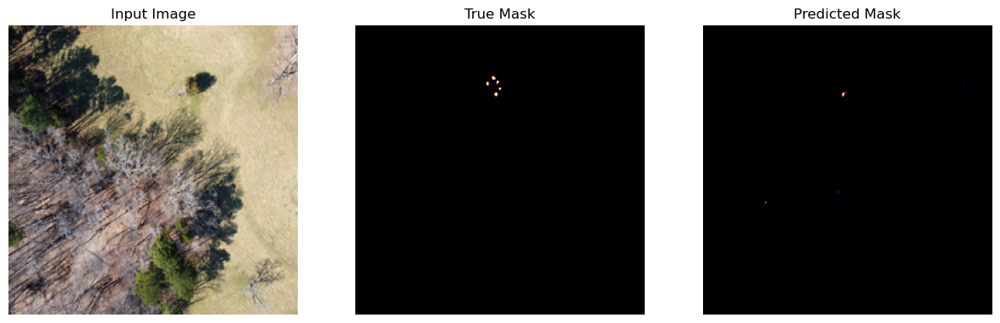

Epoch 35/50
102/102 [==============================] - 214s 2s/step - loss: 0.1628 - dice_coefficient: 0.8373 - binary_accuracy: 0.9584 - val_loss: 0.2021 - val_dice_coefficient: 0.7984 - val_binary_accuracy: 0.9598
Epoch 36/50
102/102 [==============================] - 217s 2s/step - loss: 0.1534 - dice_coefficient: 0.8466 - binary_accuracy: 0.9617 - val_loss: 0.1981 - val_dice_coefficient: 0.8020 - val_binary_accuracy: 0.9607
Epoch 37/50
102/102 [==============================] - 209s 2s/step - loss: 0.1475 - dice_coefficient: 0.8523 - binary_accuracy: 0.9637 - val_loss: 0.1961 - val_dice_coefficient: 0.8025 - val_binary_accuracy: 0.9625
Epoch 38/50
102/102 [==============================] - 208s 2s/step - loss: 0.1419 - dice_coefficient: 0.8583 - binary_accuracy: 0.9630 - val_loss: 0.1996 - val_dice_coefficient: 0.8004 - val_binary_accuracy: 0.9617
Epoch 39/50
1/1 [==============================] - 0s 53ms/step


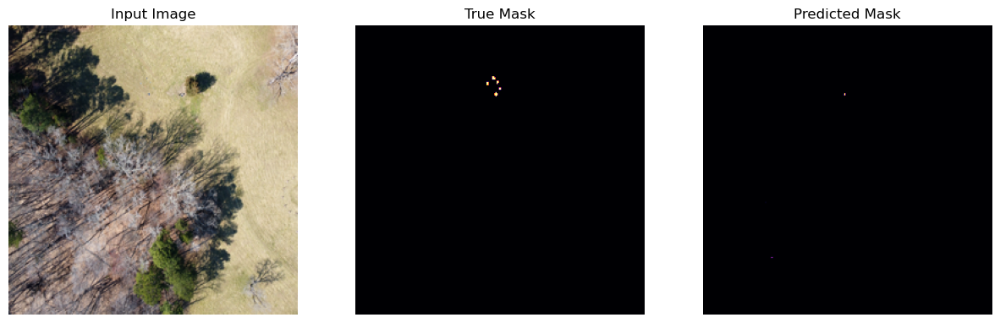

Epoch 40/50
102/102 [==============================] - 208s 2s/step - loss: 0.1491 - dice_coefficient: 0.8508 - binary_accuracy: 0.9613 - val_loss: 0.2152 - val_dice_coefficient: 0.7840 - val_binary_accuracy: 0.9573
Epoch 41/50
102/102 [==============================] - 209s 2s/step - loss: 0.1539 - dice_coefficient: 0.8463 - binary_accuracy: 0.9616 - val_loss: 0.1956 - val_dice_coefficient: 0.8040 - val_binary_accuracy: 0.9626
Epoch 42/50
102/102 [==============================] - 225s 2s/step - loss: 0.1371 - dice_coefficient: 0.8629 - binary_accuracy: 0.9660 - val_loss: 0.1974 - val_dice_coefficient: 0.8019 - val_binary_accuracy: 0.9629
Epoch 43/50
102/102 [==============================] - 220s 2s/step - loss: 0.1452 - dice_coefficient: 0.8546 - binary_accuracy: 0.9630 - val_loss: 0.2125 - val_dice_coefficient: 0.7870 - val_binary_accuracy: 0.9589
Epoch 44/50
1/1 [==============================] - 0s 49ms/step


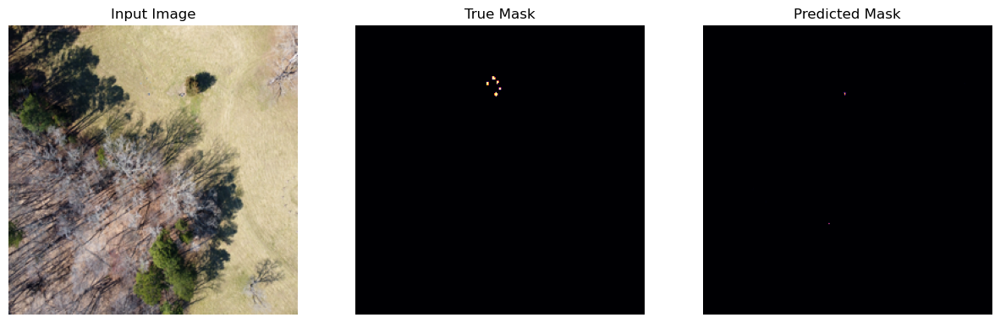

Epoch 45/50
102/102 [==============================] - 207s 2s/step - loss: 0.1360 - dice_coefficient: 0.8641 - binary_accuracy: 0.9642 - val_loss: 0.1980 - val_dice_coefficient: 0.8024 - val_binary_accuracy: 0.9618
Epoch 46/50
102/102 [==============================] - 210s 2s/step - loss: 0.1418 - dice_coefficient: 0.8582 - binary_accuracy: 0.9632 - val_loss: 0.2022 - val_dice_coefficient: 0.7964 - val_binary_accuracy: 0.9610
Epoch 47/50
102/102 [==============================] - 218s 2s/step - loss: 0.1474 - dice_coefficient: 0.8527 - binary_accuracy: 0.9649 - val_loss: 0.2013 - val_dice_coefficient: 0.7974 - val_binary_accuracy: 0.9602
Epoch 48/50
102/102 [==============================] - 229s 2s/step - loss: 0.1378 - dice_coefficient: 0.8623 - binary_accuracy: 0.9635 - val_loss: 0.1955 - val_dice_coefficient: 0.8041 - val_binary_accuracy: 0.9612
Epoch 49/50
1/1 [==============================] - 0s 51ms/step


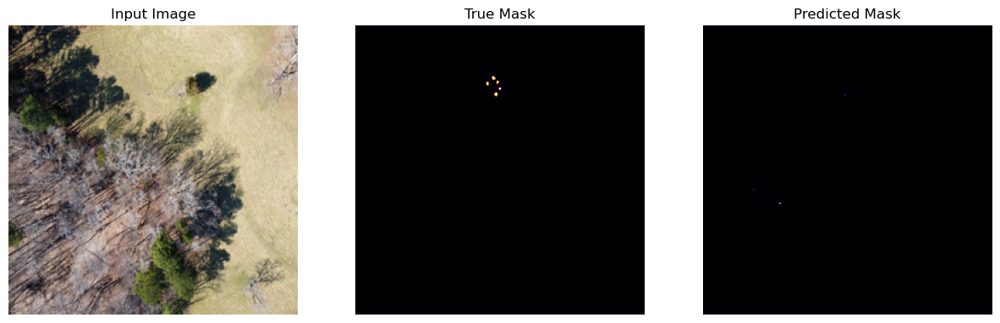

Epoch 50/50
102/102 [==============================] - 221s 2s/step - loss: 0.1393 - dice_coefficient: 0.8609 - binary_accuracy: 0.9645 - val_loss: 0.2026 - val_dice_coefficient: 0.7962 - val_binary_accuracy: 0.9629


In [69]:
# Early stopping to prevent overfitting
early_stopping_callback = tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

# Callback to display predictions during training
class PredictionDisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            show_predictions(sample_image, sample_mask)  

# Training parameters
EPOCHS = 50
STEPS_PER_EPOCH = TRAIN_SIZE // BATCH_SIZE

# Training the model
training_history = unet_model.fit(training_data, epochs=EPOCHS,
                                  steps_per_epoch=STEPS_PER_EPOCH,
                                  validation_data=validation_data,
                                  callbacks=[PredictionDisplayCallback(), early_stopping_callback])


In [27]:
unet_model.save_weights("model.h5")

## View Some Random Predictions

In [18]:
from tensorflow.keras.models import load_model
unet_model.load_weights("model1.h5")

1/1 [==============================] - 0s 58ms/step


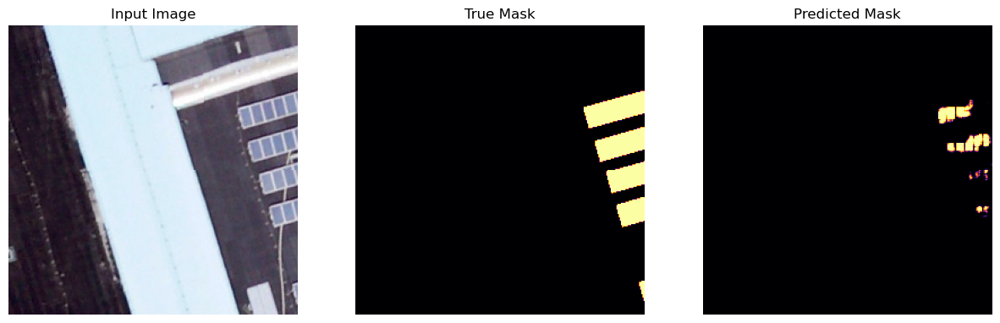

1/1 [==============================] - 0s 57ms/step


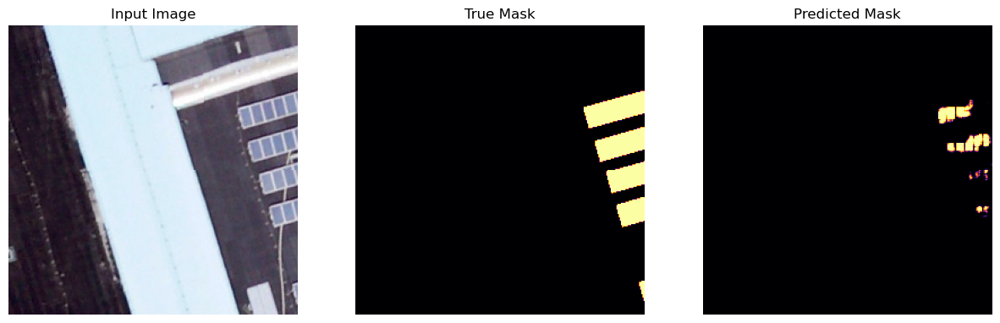

1/1 [==============================] - 0s 60ms/step


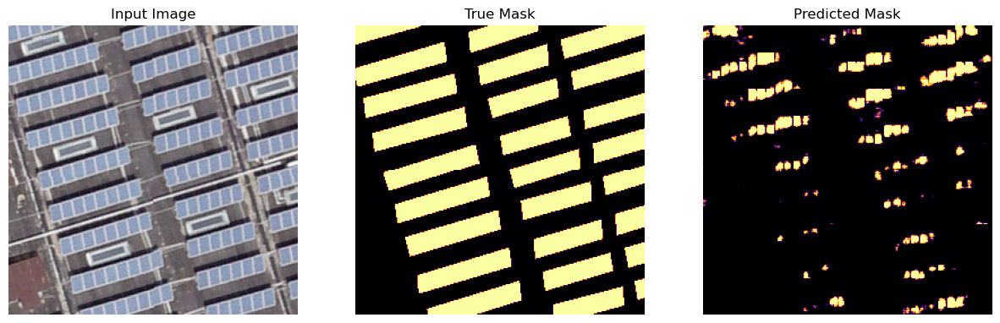

1/1 [==============================] - 0s 63ms/step


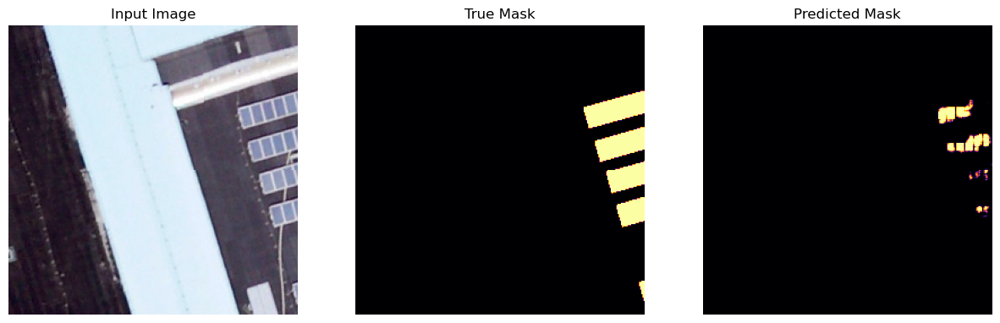

1/1 [==============================] - 0s 59ms/step


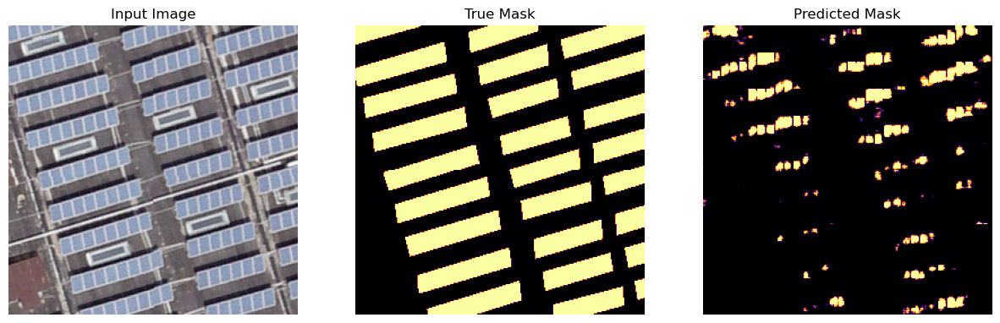

1/1 [==============================] - 0s 59ms/step


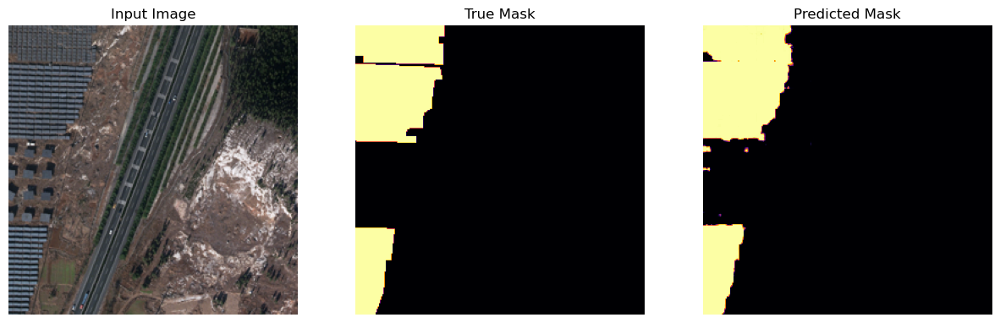

1/1 [==============================] - 0s 62ms/step


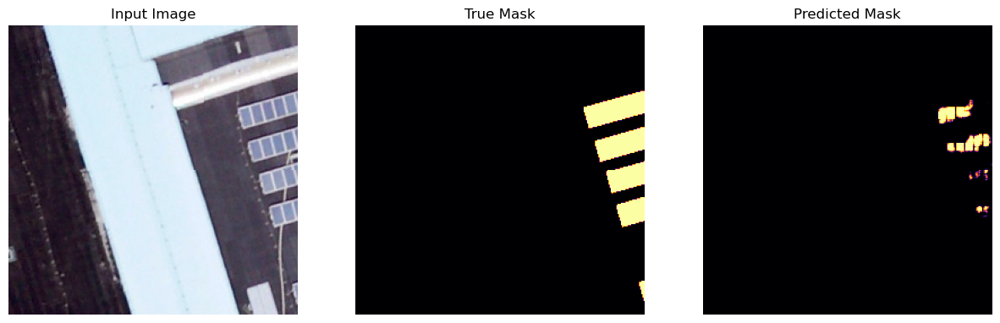

1/1 [==============================] - 0s 61ms/step


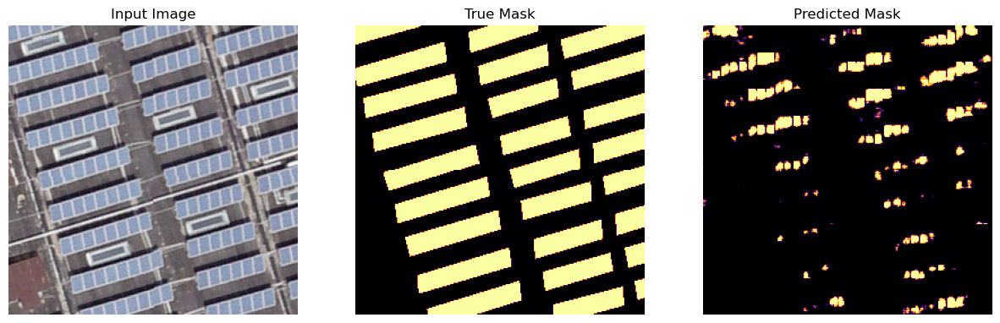

1/1 [==============================] - 0s 59ms/step


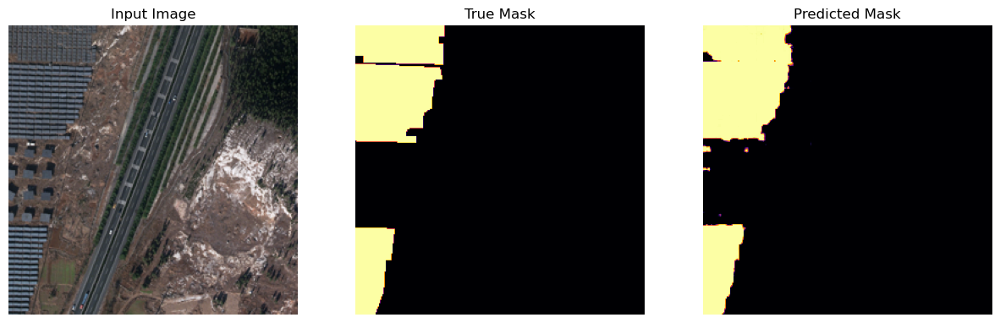

1/1 [==============================] - 0s 62ms/step


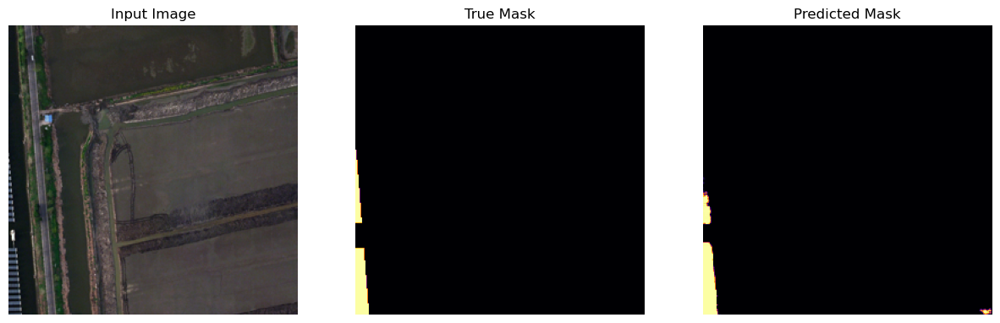

In [19]:
for i in range(5):
    for image, mask in validation_dataset.take(i):
        sample_image, sample_mask = image, mask
        show_predictions(sample_image, sample_mask)

## Predicting on a new data from Vienna with different zoom levels

In [33]:
# Function to resize and process the images
def process_new_images(image_path, image_dimensions):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, image_dimensions, method=tf.image.ResizeMethod.BICUBIC)
    image = tf.cast(image, tf.float32) / 255.0
    return image


# Function to load and process images from a directory
def load_and_process_images(directory, image_dimensions):
    processed_images = []
    image_files = [os.path.join(directory, file) for file in os.listdir(directory) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for file in image_files:
        processed_image = process_new_images(file, image_dimensions)
        processed_images.append(processed_image)

    return np.stack(processed_images)

In [34]:
# Load new images
new_images_directory = './vienna_pv/'
image_dimensions = [256, 256] # Assuming the model expects images of this size
new_images = load_and_process_images(new_images_directory, image_dimensions)

# Model predictions
# Assuming 'unet_model' is the trained model you mentioned earlier
predictions = unet_model.predict(new_images)

def display_predictions(images, predictions):
    num_images = len(images)
    plt.figure(figsize=(15, 5 * num_images))  # Adjusting figure size

    for i in range(num_images):
        plt.subplot(num_images, 2, 2*i+1)
        plt.title('Original Image')
        plt.imshow(tf.keras.preprocessing.image.array_to_img(images[i]))
        plt.axis('off')

        plt.subplot(num_images, 2, 2*i+2)
        plt.title('Predicted Mask')
        plt.imshow(tf.keras.preprocessing.image.array_to_img(predictions[i]), cmap='gray')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 52ms/step


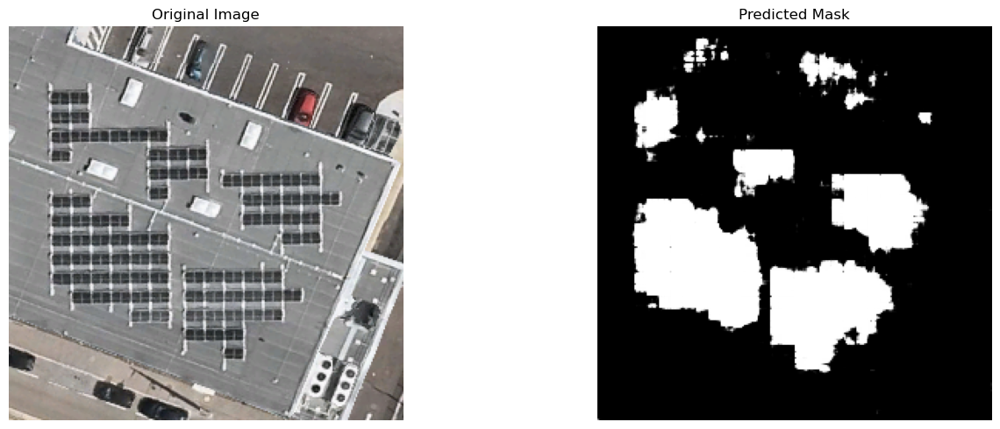

In [35]:
# Display predictions
display_predictions(new_images, predictions)

## Confusion Matrix

In [23]:
# Function to convert predictions to binary
def process_predictions(predictions, threshold=0.5):
    return np.where(predictions > threshold, 1, 0)

# Function to flatten the images and masks for confusion matrix calculation
def flatten_masks(images):
    return images.reshape(-1)

# Initialize values
TP, FP, TN, FN = 0, 0, 0, 0

# Iterate over the validation dataset
for image, true_mask in validation_dataset:
    # Ensure the input has a batch dimension
    # 'image' should have shape (batch_size, height, width, channels)
    if len(image.shape) == 3:
        image = tf.expand_dims(image, 0)

    # Generate prediction
    pred_mask = unet_model.predict(image)

    # Process prediction and true mask
    pred_mask_binary = process_predictions(pred_mask)
    true_mask_binary = process_predictions(true_mask, threshold=0.5) # Assuming true mask is not already binary

    # Flatten masks
    flat_pred_mask = flatten_masks(pred_mask_binary)
    flat_true_mask = flatten_masks(true_mask_binary)

    # Calculate confusion matrix for each image and update the aggregates
    tn, fp, fn, tp = confusion_matrix(flat_true_mask, flat_pred_mask, labels=[0,1]).ravel()
    TP += tp
    FP += fp
    TN += tn
    FN += fn

# Aggregate confusion matrix
conf_matrix = np.array([[TN, FP], [FN, TP]])

# Performance metrics
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = 2 * (precision * recall) / (precision + recall)

print("Confusion Matrix:\n", conf_matrix)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

1/1 [==============================] - 0s 59ms/step
Confusion Matrix:
 [[39333870  1072083]
 [  922600 12476503]]
Precision: 0.9208712259714777
Recall: 0.9311446445332945
F1 Score: 0.9259794411312969


The first row (26413750, 641248) represents the counts for the actual negative cases:

26413750 is the number of True Negatives (TN): These are the pixels that were correctly identified as not being part of a solar panel.
641248 is the number of False Positives (FP): These are the pixels that were incorrectly identified as part of a solar panel, but they are not.

The second row (539496, 10219778) represents the counts for the actual positive cases:

539496 is the number of False Negatives (FN): These are the pixels that were incorrectly identified as not being part of a solar panel, but they are.
10219778 is the number of True Positives (TP): These are the pixels that were correctly identified as being part of a solar panel.